<a href="https://colab.research.google.com/github/srj1407/Data_Science_and_ML/blob/main/PyTorch_Experiment_Tracking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# For this notebook to run with updated APIs, we need torch 1.12+ and torchvision 0.13+
try:
    import torch
    import torchvision
    assert int(torch.__version__.split(".")[1]) >= 12, "torch version should be 1.12+"
    assert int(torchvision.__version__.split(".")[1]) >= 13, "torchvision version should be 0.13+"
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")
except:
    print(f"[INFO] torch/torchvision versions not as required, installing nightly versions.")
    !pip3 install -U torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113
    import torch
    import torchvision
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")

torch version: 2.12.1+cu130
torchvision version: 0.27.1+cu130


In [2]:
# Continue with regular imports
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Try to import the going_modular directory, download it from GitHub if it doesn't work
try:
    from going_modular.going_modular import data_setup, engine
except:
    # Get the going_modular scripts
    print("[INFO] Couldn't find going_modular scripts... downloading them from GitHub.")
    !git clone https://github.com/mrdbourke/pytorch-deep-learning
    !mv pytorch-deep-learning/going_modular .
    !rm -rf pytorch-deep-learning
    from going_modular.going_modular import data_setup, engine

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [4]:
def set_seeds(seed: int = 42):
  torch.manual_seed(seed)
  torch.cuda.manual_seed(42)

In [5]:
import os
import zipfile

from pathlib import Path

import requests

def download_data(source: str,
                  destination: str,
                  remove_source: bool = True) -> Path:
    """Downloads a zipped dataset from source and unzips to destination.

    Args:
        source (str): A link to a zipped file containing data.
        destination (str): A target directory to unzip data to.
        remove_source (bool): Whether to remove the source after downloading and extracting.

    Returns:
        pathlib.Path to downloaded data.

    Example usage:
        download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                      destination="pizza_steak_sushi")
    """
    # Setup path to data folder
    data_path = Path("data/")
    image_path = data_path / destination

    # If the image folder doesn't exist, download it and prepare it...
    if image_path.is_dir():
        print(f"[INFO] {image_path} directory exists, skipping download.")
    else:
        print(f"[INFO] Did not find {image_path} directory, creating one...")
        image_path.mkdir(parents=True, exist_ok=True)

        # Download pizza, steak, sushi data
        target_file = Path(source).name
        with open(data_path / target_file, "wb") as f:
            request = requests.get(source)
            print(f"[INFO] Downloading {target_file} from {source}...")
            f.write(request.content)

        # Unzip pizza, steak, sushi data
        with zipfile.ZipFile(data_path / target_file, "r") as zip_ref:
            print(f"[INFO] Unzipping {target_file} data...")
            zip_ref.extractall(image_path)

        # Remove .zip file
        if remove_source:
            os.remove(data_path / target_file)

    return image_path

image_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                           destination="pizza_steak_sushi")
image_path

[INFO] data/pizza_steak_sushi directory exists, skipping download.


PosixPath('data/pizza_steak_sushi')

In [6]:
train_dir = image_path / 'train'
test_dir = image_path / 'test'

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

manual_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor,
    normalize
])

print(f'Manually created transforms: {manual_transforms}')

train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir = train_dir,
                                                                               test_dir = test_dir,
                                                                               transform = manual_transforms,
                                                                               batch_size = 32)

train_dataloader, test_dataloader, class_names

Manually created transforms: Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    <class 'torchvision.transforms.transforms.ToTensor'>
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


(<torch.utils.data.dataloader.DataLoader at 0x7ad220347ec0>,
 ['pizza', 'steak', 'sushi'])

In [7]:
train_dir = image_path / 'train'
test_dir = image_path / 'test'

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
automatic_transforms = weights.transforms()

print(f'Auto created transforms: {automatic_transforms}')

train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir = train_dir,
                                                                               test_dir = test_dir,
                                                                               transform = automatic_transforms,
                                                                               batch_size = 32)

train_dataloader, test_dataloader, class_names

Auto created transforms: ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)


(<torch.utils.data.dataloader.DataLoader at 0x7ad220243860>,
 ['pizza', 'steak', 'sushi'])

In [8]:
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
model = torchvision.models.efficientnet_b0(weights = weights).to(device)

In [9]:
for param in model.features.parameters():
  param.requires_grad = False

set_seeds()

model.classifier = torch.nn.Sequential(
    nn.Dropout(p = 0.2, inplace = True),
    nn.Linear(in_features = 1280,
              out_features = len(class_names),
              bias = True).to(device)
)

In [10]:
from torchinfo import summary

summary(model = model,
        input_size = (32, 3, 224, 224),
        verbose = 0,
        col_names = ['input_size', 'output_size', 'num_params', 'trainable'],
        col_width = 20,
        row_settings = ['var_names'])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [11]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)

In [12]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

In [13]:
from typing import List, Dict
from tqdm.auto import tqdm
from going_modular.going_modular.engine import train_step, test_step

def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          loss_fn: torch.nn.Module,
          optimizer: torch.optim.Optimizer,
          epochs: int,
          device: torch.device) -> Dict[str, List]:

          results = {
              'train_loss': [],
              'test_loss': [],
              'train_acc': [],
              'test_acc': []
          }

          for epoch in tqdm(range(epochs)):
            train_loss, train_acc = train_step(model = model,
                                               dataloader = train_dataloader,
                                               loss_fn = loss_fn,
                                               optimizer = optimizer,
                                               device = device)

            test_loss, test_acc = test_step(model = model,
                                            dataloader = test_dataloader,
                                            loss_fn = loss_fn,
                                            device = device)

            print(
                f"Epoch: {epoch + 1}",
                f"train_loss: {train_loss}",
                f"test_loss: {test_loss}",
                f"train_acc: {train_acc}",
                f"test_acc: {test_acc}"
            )

            results['train_loss'].append(train_loss)
            results['test_loss'].append(test_loss)
            results['train_acc'].append(train_acc)
            results['test_acc'].append(test_acc)

            writer.add_scalars(main_tag = "Loss",
                               tag_scalar_dict = {'train_loss': train_loss,'test_loss': test_loss},
                               global_step = epoch)

            writer.add_scalars(main_tag = "Accuracy",
                               tag_scalar_dict = {'train_acc': train_acc,'test_acc': test_acc},
                               global_step = epoch)

            writer.add_graph(model = model, input_to_model = torch.randn(32, 3, 224, 224).to(device))

          writer.close()

          return results

In [14]:
set_seeds()

train(model = model,
      train_dataloader = train_dataloader,
      test_dataloader = test_dataloader,
      loss_fn = loss_fn,
      optimizer = optimizer,
      epochs = 5,
      device = device)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 1.092427060008049 test_loss: 0.9132681290308634 train_acc: 0.3984375 test_acc: 0.5397727272727273
Epoch: 2 train_loss: 0.8974936604499817 test_loss: 0.7837486267089844 train_acc: 0.65625 test_acc: 0.8560606060606061
Epoch: 3 train_loss: 0.8037795796990395 test_loss: 0.6723187764485677 train_acc: 0.74609375 test_acc: 0.8863636363636364
Epoch: 4 train_loss: 0.6769561022520065 test_loss: 0.6698531905810038 train_acc: 0.8515625 test_acc: 0.8049242424242425
Epoch: 5 train_loss: 0.7065098062157631 test_loss: 0.6746144890785217 train_acc: 0.71875 test_acc: 0.7736742424242425


{'train_loss': [1.092427060008049,
  0.8974936604499817,
  0.8037795796990395,
  0.6769561022520065,
  0.7065098062157631],
 'test_loss': [0.9132681290308634,
  0.7837486267089844,
  0.6723187764485677,
  0.6698531905810038,
  0.6746144890785217],
 'train_acc': [0.3984375, 0.65625, 0.74609375, 0.8515625, 0.71875],
 'test_acc': [0.5397727272727273,
  0.8560606060606061,
  0.8863636363636364,
  0.8049242424242425,
  0.7736742424242425]}

In [15]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [16]:
def create_writer(experiment_name: str,
                  model_name: str,
                  extra: str = None) -> torch.utils.tensorboard.writer.SummaryWriter():

                  from datetime import datetime
                  import os

                  timestamp = datetime.now().strftime("%Y-%m-%d")
                  if extra:
                    log_dir = os.path.join('runs', timestamp, experiment_name, model_name, extra)
                  else:
                    log_dir = os.path.join('runs', timestamp, experiment_name, model_name)

                  print(f"[INFO] Created SummaryWriter, saving to: {log_dir}..")
                  return SummaryWriter(log_dir = log_dir)


In [17]:
example_writer = create_writer(experiment_name = 'data_10_percent', model_name = 'efficient_net_b0', extra = '10_epochs')
example_writer

[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_10_percent/efficient_net_b0/10_epochs..


In [18]:
def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          loss_fn: torch.nn.Module,
          optimizer: torch.optim.Optimizer,
          epochs: int,
          device: torch.device,
          writer: torch.utils.tensorboard.writer.SummaryWriter) -> Dict[str, List]:

          results = {
              'train_loss': [],
              'test_loss': [],
              'train_acc': [],
              'test_acc': []
          }

          for epoch in tqdm(range(epochs)):
            train_loss, train_acc = train_step(model = model,
                                               dataloader = train_dataloader,
                                               loss_fn = loss_fn,
                                               optimizer = optimizer,
                                               device = device)

            test_loss, test_acc = test_step(model = model,
                                            dataloader = test_dataloader,
                                            loss_fn = loss_fn,
                                            device = device)

            print(
                f"Epoch: {epoch + 1}",
                f"train_loss: {train_loss}",
                f"test_loss: {test_loss}",
                f"train_acc: {train_acc}",
                f"test_acc: {test_acc}"
            )

            results['train_loss'].append(train_loss)
            results['test_loss'].append(test_loss)
            results['train_acc'].append(train_acc)
            results['test_acc'].append(test_acc)

            if writer:
              writer.add_scalars(main_tag = "Loss",
                                tag_scalar_dict = {'train_loss': train_loss,'test_loss': test_loss},
                                global_step = epoch)

              writer.add_scalars(main_tag = "Accuracy",
                                tag_scalar_dict = {'train_acc': train_acc,'test_acc': test_acc},
                                global_step = epoch)

            else:
              pass

          writer.close()
          return results

In [19]:
data_10_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                                     destination="pizza_steak_sushi")

data_20_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip",
                                     destination="pizza_steak_sushi_20_percent")

data_100_percent_path = "pizza_steak_sushi_100_percent"

[INFO] data/pizza_steak_sushi directory exists, skipping download.
[INFO] data/pizza_steak_sushi_20_percent directory exists, skipping download.


In [20]:
from torchvision import transforms

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], # values per colour channel [red, green, blue]
                                 std=[0.229, 0.224, 0.225])

simple_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    normalize
])

train_transform_data_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.TrivialAugmentWide(),
    transforms.ToTensor(),
    normalize
])

In [21]:
import torchvision.datasets as datasets

train_dir_10_percent = data_10_percent_path / 'train'
train_dir_20_percent = data_20_percent_path / 'train'
train_dir_100_percent = datasets.Food101(root = data_100_percent_path,
                                         split = 'train',
                                         transform = simple_transform,
                                         download = True)
test_dir = data_10_percent_path / 'test'

print(f'Train directory 10 percent: {train_dir_10_percent}')
print(f'Train directory 20 percent: {train_dir_20_percent}')
print(f'Train directory 100 percent: {train_dir_100_percent}')
print(f'Test directory: {test_dir}')

Train directory 10 percent: data/pizza_steak_sushi/train
Train directory 20 percent: data/pizza_steak_sushi_20_percent/train
Train directory 100 percent: Dataset Food101
    Number of datapoints: 75750
    Root location: pizza_steak_sushi_100_percent
    split=train
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )
Test directory: data/pizza_steak_sushi/test


In [22]:
from torch.utils.data import DataLoader, Subset

BATCH_SIZE = 32

target_names = ["pizza", "steak", "sushi"]
# train_dir_100_percent is a Food101 dataset, get its class_to_idx
# to map our target names to their original integer labels
target_indices = [train_dir_100_percent.class_to_idx[name] for name in target_names]
print(f"Target original class IDs: {dict(zip(target_names, target_indices))}")

class Food3Subset(Subset):
    def __init__(self, dataset, indices, target_class_ids):
        super().__init__(dataset, indices)
        # Create a mapping from original class IDs to new 0, 1, 2 labels
        self.label_mapping = {old_id: new_id for new_id, old_id in enumerate(target_class_ids)}

    def __getitem__(self, idx):
        image, old_label = super().__getitem__(idx)
        # Map the old label to the new label (0, 1, or 2)
        return image, self.label_mapping[old_label]

    # Required for DataLoader when __getitem__ is overridden in a Subset subclass
    def __getitems__(self, indices):
        return [self.__getitem__(idx) for idx in indices]

# Filter the Food101 dataset to only include the target classes (pizza, steak, sushi)
train_subset_indices = [i for i, (_, label) in enumerate(train_dir_100_percent) if label in target_indices]

train_dataset = Food3Subset(train_dir_100_percent, train_subset_indices, target_indices)

train_dataloader_10_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir = train_dir_10_percent,
                                                                                          test_dir = test_dir,
                                                                                          transform = simple_transform,
                                                                                          batch_size = BATCH_SIZE)

train_dataloader_20_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir = train_dir_20_percent,
                                                                                          test_dir = test_dir,
                                                                                          transform = simple_transform,
                                                                                          batch_size = BATCH_SIZE)

train_dataloader_20_percent_aug, test_dataloader, class_names = data_setup.create_dataloaders(train_dir = train_dir_20_percent,
                                                                                          test_dir = test_dir,
                                                                                          transform = train_transform_data_aug,
                                                                                          batch_size = BATCH_SIZE)

# train_dataloader_100_percent now uses the filtered Food3Subset
train_dataloader_100_percent = DataLoader(dataset = train_dataset,
                                          batch_size = BATCH_SIZE,
                                          shuffle = True,
                                          num_workers = os.cpu_count())

print(f"Number of batches of size {BATCH_SIZE} in 10 percent training data: {len(train_dataloader_10_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in 20 percent training data: {len(train_dataloader_20_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in 100 percent training data: {len(train_dataloader_100_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in 20 percent augmented training data: {len(train_dataloader_20_percent_aug)}")
print(f"Number of batches of size {BATCH_SIZE} in testing data: {len(test_dataloader)} (all experiments will use the same test set)")
print(f"Number of classes: {len(class_names)}, class names: {class_names}")

Target original class IDs: {'pizza': 76, 'steak': 93, 'sushi': 95}
Number of batches of size 32 in 10 percent training data: 8
Number of batches of size 32 in 20 percent training data: 15
Number of batches of size 32 in 100 percent training data: 71
Number of batches of size 32 in 20 percent augmented training data: 15
Number of batches of size 32 in testing data: 3 (all experiments will use the same test set)
Number of classes: 3, class names: ['pizza', 'steak', 'sushi']


In [23]:
train_dataloader_20_percent

In [24]:
weights = torchvision.models.EfficientNet_B3_Weights.DEFAULT
model = torchvision.models.efficientnet_b3(weights = weights).to(device)

summary(model,
        input_size = (32, 3, 224, 224),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1536, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 40, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 40, 112, 112]   1,080                True
│    │    └─BatchNorm2d (1)                                  [32, 40, 112, 112]   [32, 40, 112, 112]   80                   True
│    │    └─SiLU (2)                                         [32, 40, 112, 112]   [32, 40, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 40, 112, 112]   [32, 24, 112

In [25]:
import torchvision
from torch import nn

OUT_FEATURES = len(class_names)

def create_effnet_b0():
  weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
  model = torchvision.models.efficientnet_b0(weights = weights).to(device)

  for param in model.features.parameters():
    param.requires_grad = False

  set_seeds()

  model.classifier = nn.Sequential(
      nn.Dropout(p = 0.2),
      nn.Linear(in_features = 1280, out_features = OUT_FEATURES)
  ).to(device)

  model.name = 'effnetb0'

  print(f"Created new {model.name} model.")

  return model

def create_effnet_b2():
  weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
  model = torchvision.models.efficientnet_b2(weights = weights).to(device)

  for param in model.features.parameters():
    param.requires_grad = False

  set_seeds()

  model.classifier = nn.Sequential(
      nn.Dropout(p = 0.3),
      nn.Linear(in_features = 1408, out_features = OUT_FEATURES)
  ).to(device)

  model.name = 'effnetb2'

  print(f"Created new {model.name} model.")

  return model

def create_effnet_b3():
  weights = torchvision.models.EfficientNet_B3_Weights.DEFAULT
  model = torchvision.models.efficientnet_b3(weights = weights).to(device)

  for param in model.features.parameters():
    param.requires_grad = False

  set_seeds()

  model.classifier = nn.Sequential(
      nn.Dropout(p = 0.2),
      nn.Linear(in_features = 1536, out_features = OUT_FEATURES)
  ).to(device)

  model.name = 'effnetb3'

  print(f"Created new {model.name} model.")

  return model

In [26]:
num_epochs = [5, 10]

models = ['effnetb0', 'effnetb2', 'effnetb3']

train_dataloaders = {
    "data_10_percent": train_dataloader_10_percent,
    "data_20_percent": train_dataloader_20_percent,
    "data_20_percent_aug": train_dataloader_20_percent_aug,
    "data_100_percent": train_dataloader_100_percent
}

In [27]:
%%time

from going_modular.going_modular.utils import save_model

set_seeds()

experiment_number = 0

for dataloader_name, train_dataloader in train_dataloaders.items():
  for epochs in num_epochs:
    for model_name in models:
      experiment_number += 1
      print(f'Experiment number: {experiment_number}')
      print(f'Dataloader: {dataloader_name}')
      print(f'Model: {model_name}')
      print(f'Epochs: {epochs}')

      if model_name == 'effnetb0':
        model = create_effnet_b0()
      elif model_name == 'effnetb2':
        model = create_effnet_b2()
      else:
        model = create_effnet_b3()

      loss_fn = nn.CrossEntropyLoss()
      optimizer = torch.optim.Adam(params = model.parameters(), lr = 0.001)

      train(model = model,
            train_dataloader = train_dataloader,
            test_dataloader = test_dataloader,
            loss_fn = loss_fn,
            optimizer = optimizer,
            epochs = epochs,
            device = device,
            writer = create_writer(experiment_name = dataloader_name,
                                   model_name = model_name,
                                   extra = f'{epochs}_epochs'))

      save_filepath = f"{model_name}_{dataloader_name}_{epochs}_epochs.pth"
      save_model(model = model,
                 target_dir = "models",
                 model_name = save_filepath)
      print("-"*50 + "\n")


Experiment number: 1
Dataloader: data_10_percent
Model: effnetb0
Epochs: 5
Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_10_percent/effnetb0/5_epochs..


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 1.052799254655838 test_loss: 0.9494966665903727 train_acc: 0.49609375 test_acc: 0.5293560606060607
Epoch: 2 train_loss: 0.8747378289699554 test_loss: 0.8638454675674438 train_acc: 0.69921875 test_acc: 0.6827651515151515
Epoch: 3 train_loss: 0.8099706023931503 test_loss: 0.8279736042022705 train_acc: 0.64453125 test_acc: 0.6922348484848485
Epoch: 4 train_loss: 0.7097539976239204 test_loss: 0.6741271813710531 train_acc: 0.7578125 test_acc: 0.8248106060606061
Epoch: 5 train_loss: 0.5980350226163864 test_loss: 0.6839583118756613 train_acc: 0.9140625 test_acc: 0.8143939393939394
[INFO] Saving model to: models/effnetb0_data_10_percent_5_epochs.pth
--------------------------------------------------

Experiment number: 2
Dataloader: data_10_percent
Model: effnetb2
Epochs: 5
Created new effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_10_percent/effnetb2/5_epochs..


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 1.0927563607692719 test_loss: 0.9585277040799459 train_acc: 0.37109375 test_acc: 0.649621212121212
Epoch: 2 train_loss: 0.9247504770755768 test_loss: 0.8988777001698812 train_acc: 0.64453125 test_acc: 0.7215909090909092
Epoch: 3 train_loss: 0.8086055666208267 test_loss: 0.8112240433692932 train_acc: 0.765625 test_acc: 0.8248106060606061
Epoch: 4 train_loss: 0.7190907523036003 test_loss: 0.7609047889709473 train_acc: 0.88671875 test_acc: 0.90625
Epoch: 5 train_loss: 0.6850025281310081 test_loss: 0.7745249470074972 train_acc: 0.76953125 test_acc: 0.8456439393939394
[INFO] Saving model to: models/effnetb2_data_10_percent_5_epochs.pth
--------------------------------------------------

Experiment number: 3
Dataloader: data_10_percent
Model: effnetb3
Epochs: 5
Created new effnetb3 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_10_percent/effnetb3/5_epochs..


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 1.06837647408247 test_loss: 1.0005702376365662 train_acc: 0.3984375 test_acc: 0.6297348484848485
Epoch: 2 train_loss: 0.9331725165247917 test_loss: 0.9192992448806763 train_acc: 0.69140625 test_acc: 0.6723484848484849
Epoch: 3 train_loss: 0.8000501617789268 test_loss: 0.7861147522926331 train_acc: 0.82421875 test_acc: 0.8125
Epoch: 4 train_loss: 0.7056152746081352 test_loss: 0.751348634560903 train_acc: 0.78515625 test_acc: 0.8333333333333334
Epoch: 5 train_loss: 0.6537330150604248 test_loss: 0.6911241014798483 train_acc: 0.83203125 test_acc: 0.8958333333333334
[INFO] Saving model to: models/effnetb3_data_10_percent_5_epochs.pth
--------------------------------------------------

Experiment number: 4
Dataloader: data_10_percent
Model: effnetb0
Epochs: 10
Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_10_percent/effnetb0/10_epochs..


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 train_loss: 1.052799254655838 test_loss: 0.9494966665903727 train_acc: 0.49609375 test_acc: 0.5293560606060607
Epoch: 2 train_loss: 0.8747378289699554 test_loss: 0.8638454675674438 train_acc: 0.69921875 test_acc: 0.6827651515151515
Epoch: 3 train_loss: 0.8099706023931503 test_loss: 0.8279736042022705 train_acc: 0.64453125 test_acc: 0.6922348484848485
Epoch: 4 train_loss: 0.7097539976239204 test_loss: 0.6741271813710531 train_acc: 0.7578125 test_acc: 0.8248106060606061
Epoch: 5 train_loss: 0.5980350226163864 test_loss: 0.6839583118756613 train_acc: 0.9140625 test_acc: 0.8143939393939394
Epoch: 6 train_loss: 0.5611924305558205 test_loss: 0.7383291125297546 train_acc: 0.8984375 test_acc: 0.7225378787878788
Epoch: 7 train_loss: 0.5574064925312996 test_loss: 0.6796189943949381 train_acc: 0.79296875 test_acc: 0.8039772727272728
Epoch: 8 train_loss: 0.47024209424853325 test_loss: 0.5988064408302307 train_acc: 0.94921875 test_acc: 0.8049242424242425
Epoch: 9 train_loss: 0.572886042296

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 train_loss: 1.0927563607692719 test_loss: 0.9585277040799459 train_acc: 0.37109375 test_acc: 0.649621212121212
Epoch: 2 train_loss: 0.9247504770755768 test_loss: 0.8988777001698812 train_acc: 0.64453125 test_acc: 0.7215909090909092
Epoch: 3 train_loss: 0.8086055666208267 test_loss: 0.8112240433692932 train_acc: 0.765625 test_acc: 0.8248106060606061
Epoch: 4 train_loss: 0.7190907523036003 test_loss: 0.7609047889709473 train_acc: 0.88671875 test_acc: 0.90625
Epoch: 5 train_loss: 0.6850025281310081 test_loss: 0.7745249470074972 train_acc: 0.76953125 test_acc: 0.8456439393939394
Epoch: 6 train_loss: 0.6111128069460392 test_loss: 0.7317257722218832 train_acc: 0.78125 test_acc: 0.7935606060606061
Epoch: 7 train_loss: 0.6126413606107235 test_loss: 0.6355619430541992 train_acc: 0.80078125 test_acc: 0.8759469696969697
Epoch: 8 train_loss: 0.5202038772404194 test_loss: 0.6921617984771729 train_acc: 0.93359375 test_acc: 0.8257575757575758
Epoch: 9 train_loss: 0.542612936347723 test_loss:

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 train_loss: 1.06837647408247 test_loss: 1.0005702376365662 train_acc: 0.3984375 test_acc: 0.6297348484848485
Epoch: 2 train_loss: 0.9331725165247917 test_loss: 0.9192992448806763 train_acc: 0.69140625 test_acc: 0.6723484848484849
Epoch: 3 train_loss: 0.8000501617789268 test_loss: 0.7861147522926331 train_acc: 0.82421875 test_acc: 0.8125
Epoch: 4 train_loss: 0.7056152746081352 test_loss: 0.751348634560903 train_acc: 0.78515625 test_acc: 0.8333333333333334
Epoch: 5 train_loss: 0.6537330150604248 test_loss: 0.6911241014798483 train_acc: 0.83203125 test_acc: 0.8958333333333334
Epoch: 6 train_loss: 0.6475860700011253 test_loss: 0.6376589934031168 train_acc: 0.75 test_acc: 0.8645833333333334
Epoch: 7 train_loss: 0.5966296829283237 test_loss: 9.862828115622202 train_acc: 0.7890625 test_acc: 0.8456439393939394
Epoch: 8 train_loss: 0.5629636757075787 test_loss: 0.6722112496693929 train_acc: 0.8125 test_acc: 0.7632575757575758
Epoch: 9 train_loss: 0.45684096962213516 test_loss: 0.666545

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.9576498786608378 test_loss: 0.714315931002299 train_acc: 0.61875 test_acc: 0.8039772727272728
Epoch: 2 train_loss: 0.6880960782368978 test_loss: 0.709983746210734 train_acc: 0.84375 test_acc: 0.7840909090909092
Epoch: 3 train_loss: 0.5798435350259145 test_loss: 0.6468614935874939 train_acc: 0.8625 test_acc: 0.7642045454545454
Epoch: 4 train_loss: 0.4930392344792684 test_loss: 0.5816546678543091 train_acc: 0.8645833333333334 test_acc: 0.8570075757575758
Epoch: 5 train_loss: 0.4885896901289622 test_loss: 0.5366938511530558 train_acc: 0.85 test_acc: 0.8664772727272728
[INFO] Saving model to: models/effnetb0_data_20_percent_5_epochs.pth
--------------------------------------------------

Experiment number: 8
Dataloader: data_20_percent
Model: effnetb2
Epochs: 5
Created new effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_20_percent/effnetb2/5_epochs..


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.9830009977022807 test_loss: 0.8083231846491495 train_acc: 0.5520833333333334 test_acc: 0.7840909090909092
Epoch: 2 train_loss: 0.7298649708429973 test_loss: 0.7500161528587341 train_acc: 0.7604166666666666 test_acc: 0.8049242424242425
Epoch: 3 train_loss: 0.6022772451241811 test_loss: 0.6611264745394388 train_acc: 0.8458333333333333 test_acc: 0.8655303030303031
Epoch: 4 train_loss: 0.5435576101144155 test_loss: 0.6331150929133097 train_acc: 0.8354166666666667 test_acc: 0.8456439393939394
Epoch: 5 train_loss: 0.4404481550057729 test_loss: 0.5280908644199371 train_acc: 0.9041666666666667 test_acc: 0.8967803030303031
[INFO] Saving model to: models/effnetb2_data_20_percent_5_epochs.pth
--------------------------------------------------

Experiment number: 9
Dataloader: data_20_percent
Model: effnetb3
Epochs: 5
Created new effnetb3 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_20_percent/effnetb3/5_epochs..


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.9737911820411682 test_loss: 0.855657955010732 train_acc: 0.5916666666666667 test_acc: 0.8248106060606061
Epoch: 2 train_loss: 0.7510063529014588 test_loss: 0.6735851168632507 train_acc: 0.7770833333333333 test_acc: 0.8655303030303031
Epoch: 3 train_loss: 0.5589135507742564 test_loss: 0.6415904959042867 train_acc: 0.8979166666666667 test_acc: 0.8238636363636364
Epoch: 4 train_loss: 0.5191502352555593 test_loss: 0.6108247637748718 train_acc: 0.85625 test_acc: 0.8248106060606061
Epoch: 5 train_loss: 0.43558958371480305 test_loss: 0.546102782090505 train_acc: 0.8958333333333334 test_acc: 0.8854166666666666
[INFO] Saving model to: models/effnetb3_data_20_percent_5_epochs.pth
--------------------------------------------------

Experiment number: 10
Dataloader: data_20_percent
Model: effnetb0
Epochs: 10
Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_20_percent/effnetb0/10_epochs..


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.9576498786608378 test_loss: 0.714315931002299 train_acc: 0.61875 test_acc: 0.8039772727272728
Epoch: 2 train_loss: 0.6880960782368978 test_loss: 0.709983746210734 train_acc: 0.84375 test_acc: 0.7840909090909092
Epoch: 3 train_loss: 0.5798435350259145 test_loss: 0.6468614935874939 train_acc: 0.8625 test_acc: 0.7642045454545454
Epoch: 4 train_loss: 0.4930392344792684 test_loss: 0.5816546678543091 train_acc: 0.8645833333333334 test_acc: 0.8570075757575758
Epoch: 5 train_loss: 0.4885896901289622 test_loss: 0.5366938511530558 train_acc: 0.85 test_acc: 0.8664772727272728
Epoch: 6 train_loss: 0.3705191413561503 test_loss: 0.7206794023513794 train_acc: 0.8854166666666666 test_acc: 0.8134469696969697
Epoch: 7 train_loss: 0.3550516734520594 test_loss: 0.46285149455070496 train_acc: 0.925 test_acc: 0.8248106060606061
Epoch: 8 train_loss: 0.3744706263144811 test_loss: 0.4314088026682536 train_acc: 0.89375 test_acc: 0.8361742424242425
Epoch: 9 train_loss: 0.2972275525331497 t

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.9830009977022807 test_loss: 0.8083231846491495 train_acc: 0.5520833333333334 test_acc: 0.7840909090909092
Epoch: 2 train_loss: 0.7298649708429973 test_loss: 0.7500161528587341 train_acc: 0.7604166666666666 test_acc: 0.8049242424242425
Epoch: 3 train_loss: 0.6022772451241811 test_loss: 0.6611264745394388 train_acc: 0.8458333333333333 test_acc: 0.8655303030303031
Epoch: 4 train_loss: 0.5435576101144155 test_loss: 0.6331150929133097 train_acc: 0.8354166666666667 test_acc: 0.8456439393939394
Epoch: 5 train_loss: 0.4404481550057729 test_loss: 0.5280908644199371 train_acc: 0.9041666666666667 test_acc: 0.8967803030303031
Epoch: 6 train_loss: 0.38890762130419415 test_loss: 0.606606125831604 train_acc: 0.9104166666666667 test_acc: 0.7840909090909092
Epoch: 7 train_loss: 0.3482885171969732 test_loss: 0.42262518405914307 train_acc: 0.9270833333333334 test_acc: 0.9280303030303031
Epoch: 8 train_loss: 0.3861986209948858 test_loss: 0.5776920219262441 train_acc: 0.8770833333333

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.9737911820411682 test_loss: 0.855657955010732 train_acc: 0.5916666666666667 test_acc: 0.8248106060606061
Epoch: 2 train_loss: 0.7510063529014588 test_loss: 0.6735851168632507 train_acc: 0.7770833333333333 test_acc: 0.8655303030303031
Epoch: 3 train_loss: 0.5589135507742564 test_loss: 0.6415904959042867 train_acc: 0.8979166666666667 test_acc: 0.8238636363636364
Epoch: 4 train_loss: 0.5191502352555593 test_loss: 0.6108247637748718 train_acc: 0.85625 test_acc: 0.8248106060606061
Epoch: 5 train_loss: 0.43558958371480305 test_loss: 0.546102782090505 train_acc: 0.8958333333333334 test_acc: 0.8854166666666666
Epoch: 6 train_loss: 0.41819834311803183 test_loss: 0.5336013734340668 train_acc: 0.8833333333333333 test_acc: 0.8248106060606061
Epoch: 7 train_loss: 0.3709221919377645 test_loss: 2.6222027043501535 train_acc: 0.9104166666666667 test_acc: 0.8655303030303031
Epoch: 8 train_loss: 0.3787412484486898 test_loss: 0.5786134401957194 train_acc: 0.8916666666666667 test_acc

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.9665119489034016 test_loss: 0.7149419585863749 train_acc: 0.5708333333333333 test_acc: 0.8238636363636364
Epoch: 2 train_loss: 0.7178373456001281 test_loss: 0.7004669507344564 train_acc: 0.8229166666666666 test_acc: 0.7945075757575758
Epoch: 3 train_loss: 0.6243713776270549 test_loss: 0.5543355743090311 train_acc: 0.8145833333333333 test_acc: 0.8456439393939394
Epoch: 4 train_loss: 0.5531692445278168 test_loss: 0.5016173124313354 train_acc: 0.8229166666666666 test_acc: 0.8778409090909092
Epoch: 5 train_loss: 0.5771433035532634 test_loss: 0.4582744638125102 train_acc: 0.775 test_acc: 0.9176136363636364
[INFO] Saving model to: models/effnetb0_data_20_percent_aug_5_epochs.pth
--------------------------------------------------

Experiment number: 14
Dataloader: data_20_percent_aug
Model: effnetb2
Epochs: 5
Created new effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_20_percent_aug/effnetb2/5_epochs..


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.9967797040939331 test_loss: 0.8095113635063171 train_acc: 0.49583333333333335 test_acc: 0.7945075757575758
Epoch: 2 train_loss: 0.7743930617968241 test_loss: 0.7273794412612915 train_acc: 0.75 test_acc: 0.8560606060606061
Epoch: 3 train_loss: 0.6741062680880229 test_loss: 0.6277313232421875 train_acc: 0.7916666666666666 test_acc: 0.9176136363636364
Epoch: 4 train_loss: 0.5766163627306621 test_loss: 0.6008569399515787 train_acc: 0.80625 test_acc: 0.8570075757575758
Epoch: 5 train_loss: 0.5099547644456227 test_loss: 0.4700436294078827 train_acc: 0.85 test_acc: 0.9176136363636364
[INFO] Saving model to: models/effnetb2_data_20_percent_aug_5_epochs.pth
--------------------------------------------------

Experiment number: 15
Dataloader: data_20_percent_aug
Model: effnetb3
Epochs: 5
Created new effnetb3 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_20_percent_aug/effnetb3/5_epochs..


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.9770453055699666 test_loss: 0.8409289121627808 train_acc: 0.625 test_acc: 0.8456439393939394
Epoch: 2 train_loss: 0.7853286782900493 test_loss: 0.676599899927775 train_acc: 0.7604166666666666 test_acc: 0.8352272727272728
Epoch: 3 train_loss: 0.5811505377292633 test_loss: 0.6008463104565939 train_acc: 0.88125 test_acc: 0.8143939393939394
Epoch: 4 train_loss: 0.5497857848803203 test_loss: 0.5684765179951986 train_acc: 0.8729166666666667 test_acc: 0.8655303030303031
Epoch: 5 train_loss: 0.46283201773961385 test_loss: 0.5130764444669088 train_acc: 0.8916666666666667 test_acc: 0.8352272727272728
[INFO] Saving model to: models/effnetb3_data_20_percent_aug_5_epochs.pth
--------------------------------------------------

Experiment number: 16
Dataloader: data_20_percent_aug
Model: effnetb0
Epochs: 10
Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_20_percent_aug/effnetb0/10_epochs..


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.9665119489034016 test_loss: 0.7149419585863749 train_acc: 0.5708333333333333 test_acc: 0.8238636363636364
Epoch: 2 train_loss: 0.7178373456001281 test_loss: 0.7004669507344564 train_acc: 0.8229166666666666 test_acc: 0.7945075757575758
Epoch: 3 train_loss: 0.6243713776270549 test_loss: 0.5543355743090311 train_acc: 0.8145833333333333 test_acc: 0.8456439393939394
Epoch: 4 train_loss: 0.5531692445278168 test_loss: 0.5016173124313354 train_acc: 0.8229166666666666 test_acc: 0.8778409090909092
Epoch: 5 train_loss: 0.5771433035532634 test_loss: 0.4582744638125102 train_acc: 0.775 test_acc: 0.9176136363636364
Epoch: 6 train_loss: 0.45644306937853496 test_loss: 0.4451817174752553 train_acc: 0.875 test_acc: 0.8456439393939394
Epoch: 7 train_loss: 0.43830952048301697 test_loss: 0.37779171268145245 train_acc: 0.8916666666666667 test_acc: 0.9071969696969697
Epoch: 8 train_loss: 0.4410892476638158 test_loss: 0.37529529134432477 train_acc: 0.85625 test_acc: 0.8873106060606061
E

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.9967797040939331 test_loss: 0.8095113635063171 train_acc: 0.49583333333333335 test_acc: 0.7945075757575758
Epoch: 2 train_loss: 0.7743930617968241 test_loss: 0.7273794412612915 train_acc: 0.75 test_acc: 0.8560606060606061
Epoch: 3 train_loss: 0.6741062680880229 test_loss: 0.6277313232421875 train_acc: 0.7916666666666666 test_acc: 0.9176136363636364
Epoch: 4 train_loss: 0.5766163627306621 test_loss: 0.6008569399515787 train_acc: 0.80625 test_acc: 0.8570075757575758
Epoch: 5 train_loss: 0.5099547644456227 test_loss: 0.4700436294078827 train_acc: 0.85 test_acc: 0.9176136363636364
Epoch: 6 train_loss: 0.45140861670176186 test_loss: 0.5321808258692423 train_acc: 0.8875 test_acc: 0.8873106060606061
Epoch: 7 train_loss: 0.4447503407796224 test_loss: 0.46278737982114154 train_acc: 0.86875 test_acc: 0.8873106060606061
Epoch: 8 train_loss: 0.4424801290035248 test_loss: 0.5105674763520559 train_acc: 0.85 test_acc: 0.8873106060606061
Epoch: 9 train_loss: 0.3979995946089427 t

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.9770453055699666 test_loss: 0.8409289121627808 train_acc: 0.625 test_acc: 0.8456439393939394
Epoch: 2 train_loss: 0.7853286782900493 test_loss: 0.676599899927775 train_acc: 0.7604166666666666 test_acc: 0.8352272727272728
Epoch: 3 train_loss: 0.5811505377292633 test_loss: 0.6008463104565939 train_acc: 0.88125 test_acc: 0.8143939393939394
Epoch: 4 train_loss: 0.5497857848803203 test_loss: 0.5684765179951986 train_acc: 0.8729166666666667 test_acc: 0.8655303030303031
Epoch: 5 train_loss: 0.46283201773961385 test_loss: 0.5130764444669088 train_acc: 0.8916666666666667 test_acc: 0.8352272727272728
Epoch: 6 train_loss: 0.4607853511969248 test_loss: 0.505954643090566 train_acc: 0.8729166666666667 test_acc: 0.8863636363636364
Epoch: 7 train_loss: 0.41331645647684734 test_loss: 0.4767322639624278 train_acc: 0.8979166666666667 test_acc: 0.8456439393939394
Epoch: 8 train_loss: 0.466218493382136 test_loss: 0.48529141147931415 train_acc: 0.8625 test_acc: 0.7945075757575758
Epoc

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.6620229642156145 test_loss: 0.4274484117825826 train_acc: 0.7754401408450704 test_acc: 0.8967803030303031
Epoch: 2 train_loss: 0.39122016622986594 test_loss: 0.4237176279226939 train_acc: 0.8798415492957746 test_acc: 0.8863636363636364
Epoch: 3 train_loss: 0.3440781573594456 test_loss: 0.4832794467608134 train_acc: 0.8863556338028169 test_acc: 0.7537878787878788
Epoch: 4 train_loss: 0.31351575989958264 test_loss: 0.31527456641197205 train_acc: 0.8900528169014085 test_acc: 0.9280303030303031
Epoch: 5 train_loss: 0.28284618111563403 test_loss: 0.42102961738904315 train_acc: 0.9021126760563379 test_acc: 0.8664772727272728
[INFO] Saving model to: models/effnetb0_data_100_percent_5_epochs.pth
--------------------------------------------------

Experiment number: 20
Dataloader: data_100_percent
Model: effnetb2
Epochs: 5
Created new effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_100_percent/effnetb2/5_epochs..


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.6847766641999634 test_loss: 0.5534893671671549 train_acc: 0.7744718309859154 test_acc: 0.8049242424242425
Epoch: 2 train_loss: 0.419422124892893 test_loss: 0.4726216991742452 train_acc: 0.8757042253521127 test_acc: 0.8446969696969697
Epoch: 3 train_loss: 0.3571505198176478 test_loss: 0.44903279344240826 train_acc: 0.8834507042253521 test_acc: 0.8759469696969697
Epoch: 4 train_loss: 0.33526873882387725 test_loss: 0.3920244375864665 train_acc: 0.8847711267605634 test_acc: 0.8352272727272728
Epoch: 5 train_loss: 0.31186560027196375 test_loss: 0.36171825726826984 train_acc: 0.8880281690140844 test_acc: 0.8967803030303031
[INFO] Saving model to: models/effnetb2_data_100_percent_5_epochs.pth
--------------------------------------------------

Experiment number: 21
Dataloader: data_100_percent
Model: effnetb3
Epochs: 5
Created new effnetb3 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_100_percent/effnetb3/5_epochs..


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.6682666338665385 test_loss: 0.5088076194127401 train_acc: 0.7704225352112677 test_acc: 0.8456439393939394
Epoch: 2 train_loss: 0.39319784372625216 test_loss: 0.4238440791765849 train_acc: 0.8785211267605634 test_acc: 0.8560606060606061
Epoch: 3 train_loss: 0.3359148613583874 test_loss: 0.381073921918869 train_acc: 0.8903169014084507 test_acc: 0.8551136363636364
Epoch: 4 train_loss: 0.3019853819843749 test_loss: 0.3435412446657817 train_acc: 0.8986795774647887 test_acc: 0.8854166666666666
Epoch: 5 train_loss: 0.2717551072718392 test_loss: 0.39536812901496887 train_acc: 0.906161971830986 test_acc: 0.8863636363636364
[INFO] Saving model to: models/effnetb3_data_100_percent_5_epochs.pth
--------------------------------------------------

Experiment number: 22
Dataloader: data_100_percent
Model: effnetb0
Epochs: 10
Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2026-07-05/data_100_percent/effnetb0/10_epochs..


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.6620229642156145 test_loss: 0.4274484117825826 train_acc: 0.7754401408450704 test_acc: 0.8967803030303031
Epoch: 2 train_loss: 0.39122016622986594 test_loss: 0.4237176279226939 train_acc: 0.8798415492957746 test_acc: 0.8863636363636364
Epoch: 3 train_loss: 0.3440781573594456 test_loss: 0.4832794467608134 train_acc: 0.8863556338028169 test_acc: 0.7537878787878788
Epoch: 4 train_loss: 0.31351575989958264 test_loss: 0.31527456641197205 train_acc: 0.8900528169014085 test_acc: 0.9280303030303031
Epoch: 5 train_loss: 0.28284618111563403 test_loss: 0.42102961738904315 train_acc: 0.9021126760563379 test_acc: 0.8664772727272728
Epoch: 6 train_loss: 0.26532280843862344 test_loss: 0.5329133719205856 train_acc: 0.9124119718309859 test_acc: 0.8456439393939394
Epoch: 7 train_loss: 0.2646466152558864 test_loss: 0.30507511893908185 train_acc: 0.903080985915493 test_acc: 0.8560606060606061
Epoch: 8 train_loss: 0.243981170087633 test_loss: 0.270587682723999 train_acc: 0.9184859154

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.6847766641999634 test_loss: 0.5534893671671549 train_acc: 0.7744718309859154 test_acc: 0.8049242424242425
Epoch: 2 train_loss: 0.419422124892893 test_loss: 0.4726216991742452 train_acc: 0.8757042253521127 test_acc: 0.8446969696969697
Epoch: 3 train_loss: 0.3571505198176478 test_loss: 0.44903279344240826 train_acc: 0.8834507042253521 test_acc: 0.8759469696969697
Epoch: 4 train_loss: 0.33526873882387725 test_loss: 0.3920244375864665 train_acc: 0.8847711267605634 test_acc: 0.8352272727272728
Epoch: 5 train_loss: 0.31186560027196375 test_loss: 0.36171825726826984 train_acc: 0.8880281690140844 test_acc: 0.8967803030303031
Epoch: 6 train_loss: 0.2971195259564359 test_loss: 0.460830678542455 train_acc: 0.8967429577464789 test_acc: 0.8551136363636364
Epoch: 7 train_loss: 0.2799291424977947 test_loss: 0.23718073467413583 train_acc: 0.9100352112676056 test_acc: 0.9479166666666666
Epoch: 8 train_loss: 0.27036124719700344 test_loss: 0.3868277321259181 train_acc: 0.9025528169

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 train_loss: 0.6682666338665385 test_loss: 0.5088076194127401 train_acc: 0.7704225352112677 test_acc: 0.8456439393939394
Epoch: 2 train_loss: 0.39319784372625216 test_loss: 0.4238440791765849 train_acc: 0.8785211267605634 test_acc: 0.8560606060606061
Epoch: 3 train_loss: 0.3359148613583874 test_loss: 0.381073921918869 train_acc: 0.8903169014084507 test_acc: 0.8551136363636364
Epoch: 4 train_loss: 0.3019853819843749 test_loss: 0.3435412446657817 train_acc: 0.8986795774647887 test_acc: 0.8854166666666666
Epoch: 5 train_loss: 0.2717551072718392 test_loss: 0.39536812901496887 train_acc: 0.906161971830986 test_acc: 0.8863636363636364
Epoch: 6 train_loss: 0.2518910738364072 test_loss: 20.92373412847519 train_acc: 0.9190140845070423 test_acc: 0.8759469696969697
Epoch: 7 train_loss: 0.25298784421363346 test_loss: 3.8744992166757584 train_acc: 0.911443661971831 test_acc: 0.8967803030303031
Epoch: 8 train_loss: 0.2456980935284789 test_loss: 0.42614681522051495 train_acc: 0.91531690140845

In [28]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 44986), started 0:22:06 ago. (Use '!kill 44986' to kill it.)

<IPython.core.display.Javascript object>

In [29]:
best_model_path = "models/effnetb2_data_20_percent_10_epochs.pth"
best_model = create_effnet_b2()
best_model.load_state_dict(torch.load(best_model_path))

Created new effnetb2 model.


<All keys matched successfully>

In [30]:
from pathlib import Path
effnetb2_model_size = Path(best_model_path).stat().st_size // (1024 * 1024)
print(f'Model size: {effnetb2_model_size} MB')

Model size: 29 MB


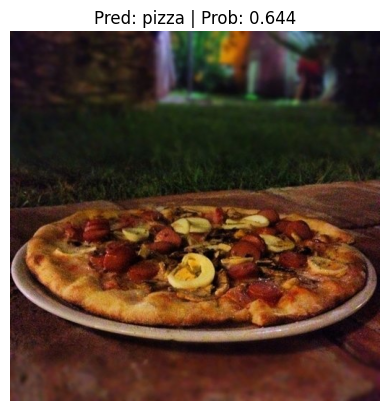

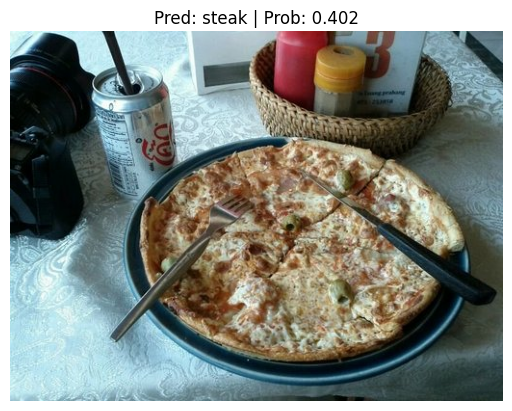

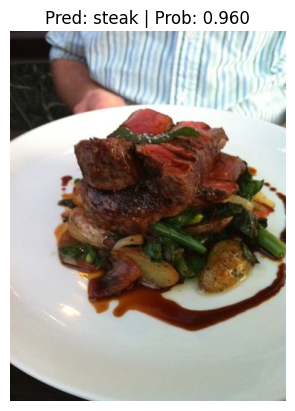

In [31]:
from going_modular.going_modular.predictions import pred_and_plot_image

import random
num_images_to_plot = 3
test_image_path_list = list(Path(data_20_percent_path / "test").glob("*/*.jpg"))
test_image_path_sample = random.sample(population=test_image_path_list,
                                       k=num_images_to_plot)

for image_path in test_image_path_sample:
    pred_and_plot_image(model=best_model,
                        image_path=image_path,
                        class_names=class_names,
                        image_size=(224, 224))

data/04-pizza-dad.jpeg already exists, skipping download.


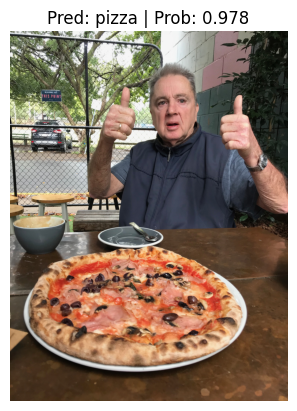

In [32]:
# Download custom image
import requests

# Setup custom image path
custom_image_path = Path("data/04-pizza-dad.jpeg")

# Download the image if it doesn't already exist
if not custom_image_path.is_file():
    with open(custom_image_path, "wb") as f:
        # When downloading from GitHub, need to use the "raw" file link
        request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/04-pizza-dad.jpeg")
        print(f"Downloading {custom_image_path}...")
        f.write(request.content)
else:
    print(f"{custom_image_path} already exists, skipping download.")

# Predict on custom image
pred_and_plot_image(model=best_model,
                    image_path=custom_image_path,
                    class_names=class_names)